<a href="https://colab.research.google.com/github/shaks2510/SProject/blob/main/DeepLearning_Wine.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [80]:
import tensorflow as tf
print(tf.__version__)

2.12.0


In [81]:
# Import pandas
import pandas as pd
import numpy as np

# Read in white wine data
white = pd.read_csv("http://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-white.csv", sep=';')

# Read in red wine data
red = pd.read_csv("http://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-red.csv", sep=';')

In [82]:
# Print info on white wine
print(white.info())

# Print info on red wine
print(red.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column   

In [4]:
white.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


In [5]:
red.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [6]:
pd.isnull(red).count()

fixed acidity           1599
volatile acidity        1599
citric acid             1599
residual sugar          1599
chlorides               1599
free sulfur dioxide     1599
total sulfur dioxide    1599
density                 1599
pH                      1599
sulphates               1599
alcohol                 1599
quality                 1599
dtype: int64

In [7]:
pd.isnull(white).count()

fixed acidity           4898
volatile acidity        4898
citric acid             4898
residual sugar          4898
chlorides               4898
free sulfur dioxide     4898
total sulfur dioxide    4898
density                 4898
pH                      4898
sulphates               4898
alcohol                 4898
quality                 4898
dtype: int64

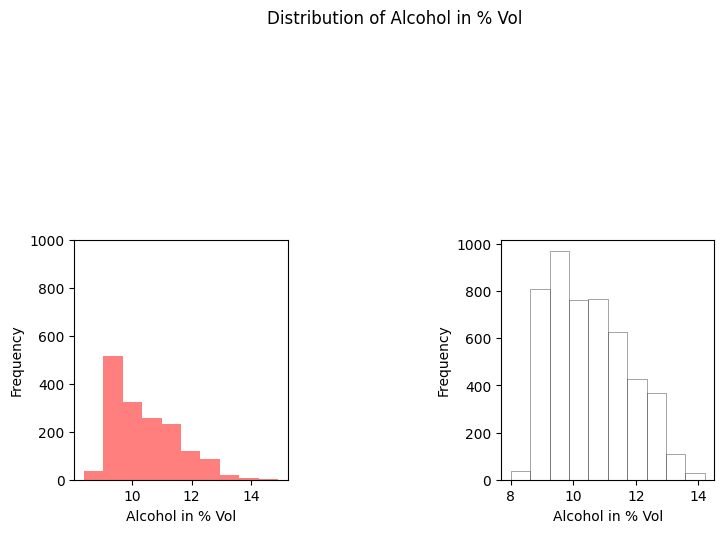

In [8]:
%matplotlib inline

import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2)

ax[0].hist(red.alcohol, 10, facecolor='red', alpha=0.5, label="Red wine")
ax[1].hist(white.alcohol, 10, facecolor='white', ec="black", lw=0.5, alpha=0.5, label="White wine")

fig.subplots_adjust(left=0, right=1, bottom=0, top=0.5, hspace=0.05, wspace=1)
ax[0].set_ylim([0, 1000])
ax[0].set_xlabel("Alcohol in % Vol")
ax[0].set_ylabel("Frequency")
ax[1].set_xlabel("Alcohol in % Vol")
ax[1].set_ylabel("Frequency")
#ax[0].legend(loc='best')
#ax[1].legend(loc='best')
fig.suptitle("Distribution of Alcohol in % Vol")

plt.show()

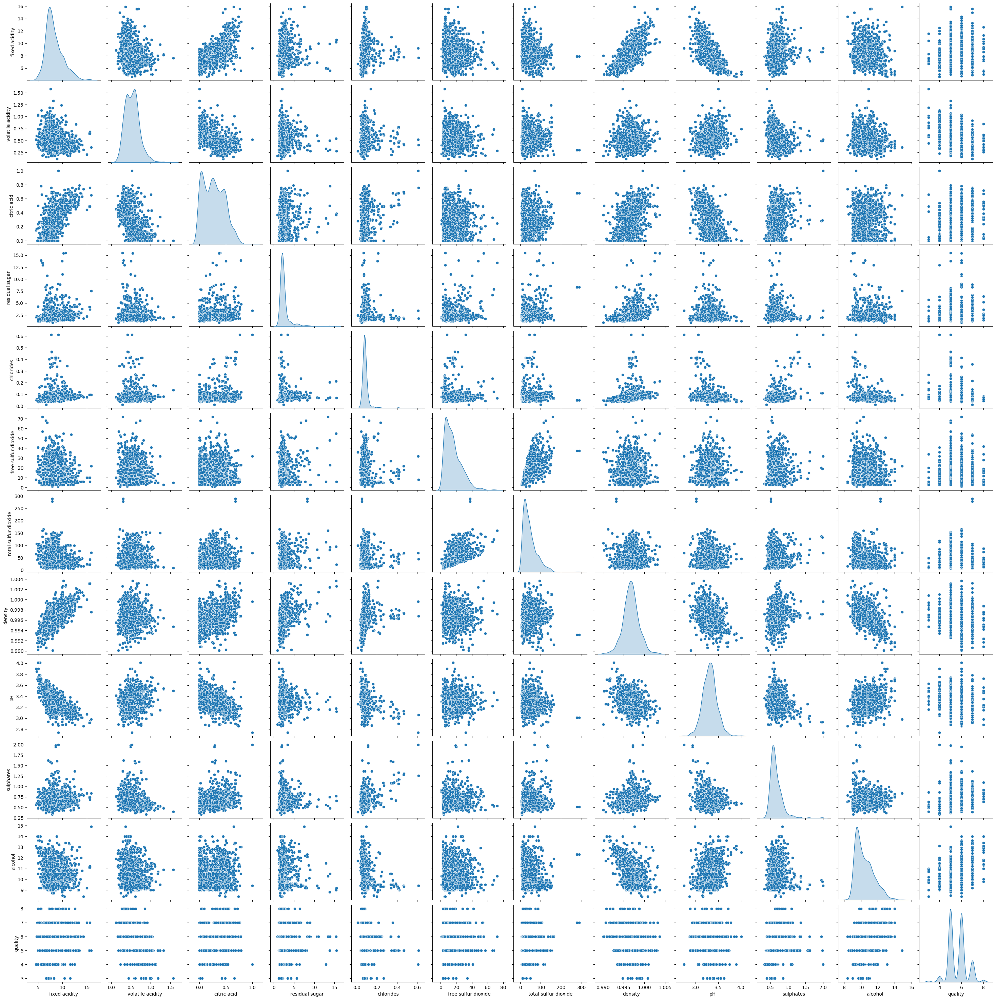

In [9]:
import seaborn as sns

sns.pairplot(data=red, diag_kind = 'kde')



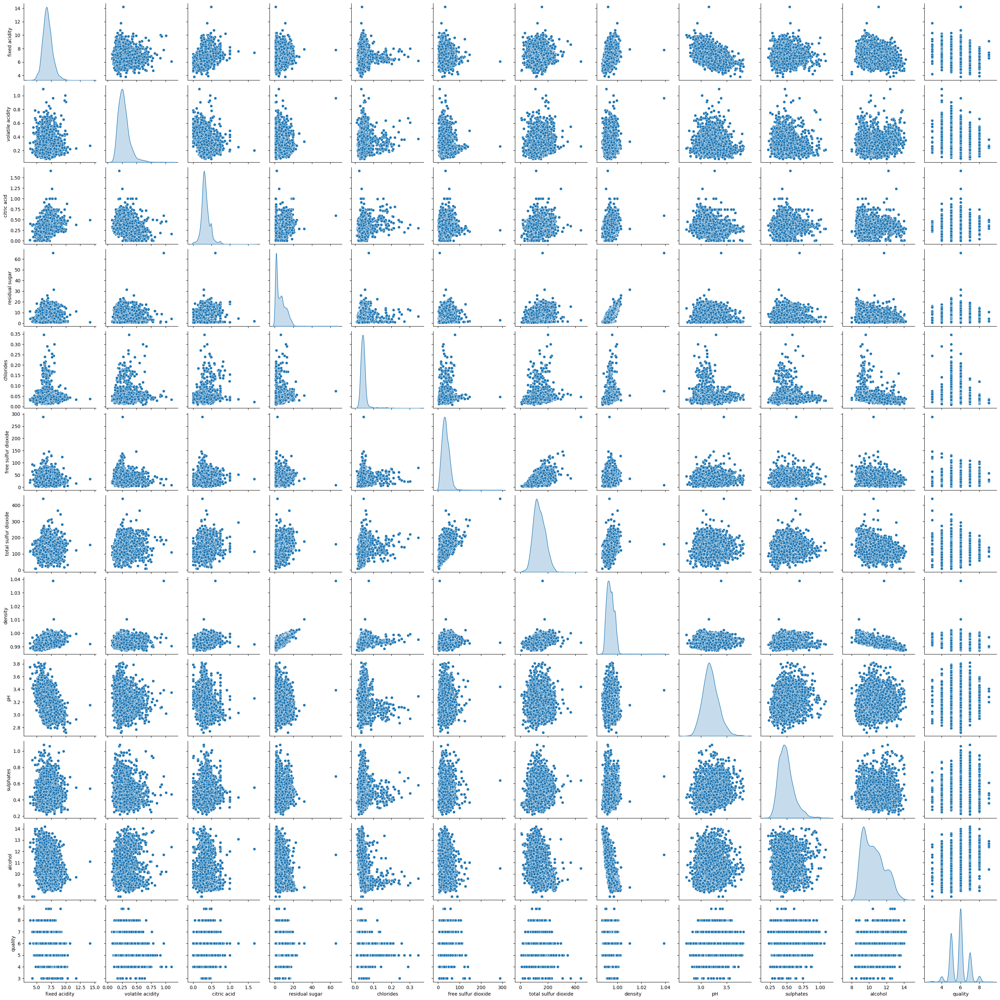

In [10]:
sns.pairplot(data=white, diag_kind = 'kde')

In [83]:
# Add `type` column to `red` with value 1
red['type'] = 1

# Add `type` column to `white` with value 0
white['type'] = 0

# Append `white` to `red`
wines = red.append(white, ignore_index=True)
wines.tail()

<ipython-input-83-7a75f674a909>:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wines = red.append(white, ignore_index=True)


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,type
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,0
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,0
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,0
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,0
6496,6.0,0.21,0.38,0.8,0.020,22.0,98.0,0.98941,3.26,0.32,11.8,6,0


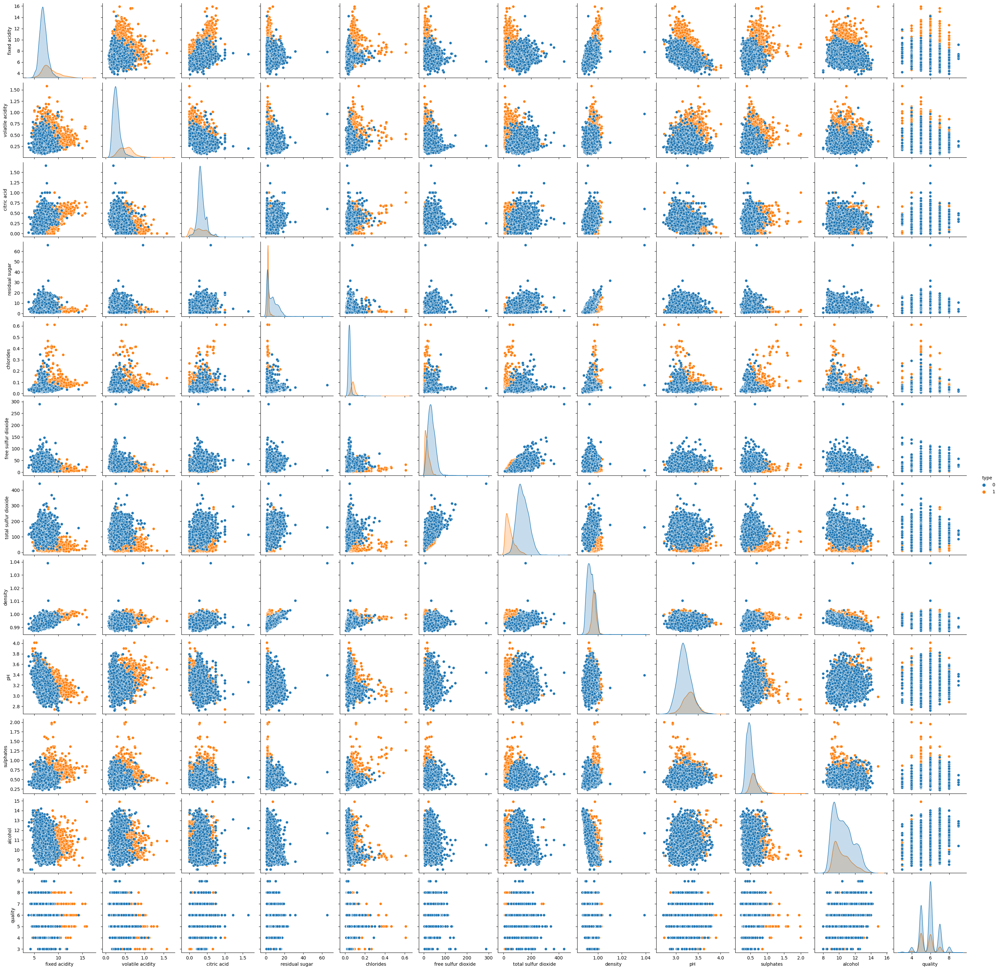

In [13]:
import seaborn as sns
sns.pairplot(wines, diag_kind = 'kde' , hue='type')


In [84]:
# Import `train_test_split` from `sklearn.model_selection`
from sklearn.model_selection import train_test_split

# Specify the data
X=wines.iloc[:,0:11]

# Specify the target labels and flatten the array
y= np.ravel(wines.type)
#y= wines.type

# Split the data up in train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

In [85]:
y_test[0:10]

array([0, 1, 0, 0, 0, 1, 0, 0, 1, 0])

In [86]:
# Import `StandardScaler` from `sklearn.preprocessing`
from sklearn.preprocessing import StandardScaler

# Define the scaler
scaler = StandardScaler().fit(X_train)

# Scale the train set
X_train = scaler.transform(X_train)

# Scale the test set
X_test = scaler.transform(X_test)

In [87]:
X_train.size

50017

In [88]:
# Using Tensorflow Keras instead of the original Keras



from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense

# define the model architecture

# Initialize the constructor
model = Sequential()

# Add an input layer
model.add(Dense(30, activation='relu', input_shape=(11,)))
model.add(Dense(20, activation='relu'))

# Add an output layer
model.add(Dense(1, activation='sigmoid'))

In [89]:
model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

epochs = 20
batch_size = 50017



In [64]:
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_14 (Dense)            (None, 30)                360       
                                                                 
 dense_15 (Dense)            (None, 20)                620       
                                                                 
 dense_16 (Dense)            (None, 1)                 21        
                                                                 
Total params: 1,001
Trainable params: 1,001
Non-trainable params: 0
_________________________________________________________________


In [90]:
history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split= .3, verbose=True)
loss, accuracy = model.evaluate(X_test, y_test, verbose=False)


Epoch 1/20
1/1 [==============================] - 1s 964ms/step - loss: 0.7988 - accuracy: 0.3580 - val_loss: 0.7614 - val_accuracy: 0.4220
Epoch 2/20
1/1 [==============================] - 0s 55ms/step - loss: 0.7790 - accuracy: 0.3834 - val_loss: 0.7427 - val_accuracy: 0.4549
Epoch 3/20
1/1 [==============================] - 0s 45ms/step - loss: 0.7597 - accuracy: 0.4107 - val_loss: 0.7245 - val_accuracy: 0.4938
Epoch 4/20
1/1 [==============================] - 0s 39ms/step - loss: 0.7409 - accuracy: 0.4481 - val_loss: 0.7069 - val_accuracy: 0.5150
Epoch 5/20
1/1 [==============================] - 0s 37ms/step - loss: 0.7227 - accuracy: 0.4846 - val_loss: 0.6898 - val_accuracy: 0.5399
Epoch 6/20
1/1 [==============================] - 0s 55ms/step - loss: 0.7050 - accuracy: 0.5179 - val_loss: 0.6733 - val_accuracy: 0.5744
Epoch 7/20
1/1 [==============================] - 0s 40ms/step - loss: 0.6878 - accuracy: 0.5503 - val_loss: 0.6573 - val_accuracy: 0.6051
Epoch 8/20
1/1 [==========

[0.42197802662849426, 0.45494505763053894, 0.4937728941440582, 0.5150183439254761, 0.5399267673492432, 0.5743589997291565, 0.6051282286643982, 0.6388278603553772, 0.6659340858459473, 0.7054945230484009, 0.730402946472168, 0.7531135678291321, 0.7831501960754395, 0.8095238208770752, 0.8300366401672363, 0.8490842580795288, 0.8666666746139526, 0.8769230842590332, 0.8886446952819824, 0.89670330286026]
[0.35795098543167114, 0.3834066689014435, 0.4107479453086853, 0.4481458067893982, 0.48460087180137634, 0.517913281917572, 0.5502828359603882, 0.5801382660865784, 0.6172218918800354, 0.6461344957351685, 0.6772469878196716, 0.7093023061752319, 0.7363293766975403, 0.7592709064483643, 0.7825267314910889, 0.8086109161376953, 0.8262099027633667, 0.8450660109519958, 0.8598365783691406, 0.8746071457862854]


<Axes: >

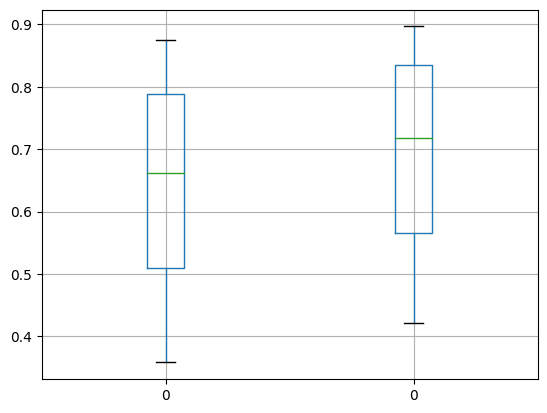

In [91]:
print(history.history['val_accuracy'])

print(history.history['accuracy'])

ta = pd.DataFrame(history.history['accuracy'])
va = pd.DataFrame(history.history['val_accuracy'])

tva = pd.concat([ta, va], axis= 1)

tva.boxplot()

In [40]:
y_pred = np.round(model.predict(X_test))

61/61 [==============================] - 0s 2ms/step


In [41]:
y_pred[0:10]

array([[0.],
       [1.],
       [0.],
       [0.],
       [0.],
       [1.],
       [0.],
       [0.],
       [1.],
       [0.]], dtype=float32)

In [42]:
loss, acc = model.evaluate(X_test, y_test, verbose=0)
print('Test Accuracy: %.3f' % acc)


loss, acc = model.evaluate(X_train, y_train, verbose=0)
print('Test Accuracy: %.3f' % acc)

Test Accuracy: 0.995
Test Accuracy: 0.998


In [43]:
from sklearn import metrics

print(pd.DataFrame(metrics.confusion_matrix(y_test, y_pred, labels=[0 ,1]), index=['true:White', 'true:Red'], columns=['pred:White', 'pred:Red']))

            pred:White  pred:Red
true:White        1446         2
true:Red             8       494


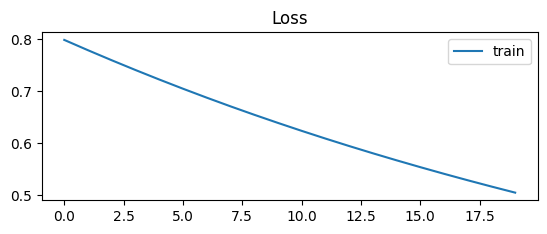

In [92]:
%matplotlib inline
from matplotlib import pyplot
from numpy import where

# plot loss during training
pyplot.subplot(211)
pyplot.title('Loss')
pyplot.plot(history.history['loss'], label='train')
pyplot.legend()